# Projet d'altimétrie - Mer de Chine méridoniale <a class='anchor' id='intro'></a>

**Marine REGIEN - M2 GGL 2021/2022**

Ce projet a pour but de calculer la tendance du niveau de la mer à partir des données altimétriques, puis de les comparer avec les données des marégraphes à proximité.
La zone ici présentée est la mer de Chine méridoniale qui fait partie de l'océan Pacifique. Cette mer couvre une superficie d'environ 3 500 000 km2 entre la Malaisie continentale, les îles Bangka et Belitung, la Malaisie orientale au sud et le détroit de Taïwan au nord, entre le Viêt Nam à l'ouest et les Philippines à l'est. (Wikipédia)

*Quelles similitudes et quelles différences pourra-t-on observer entre les mesures altimétriques et les mesures marégraphiques en mer de Chine du Sud ?*

Dans le cadre de cette problématique, une étude comparative des tendances et un calcul de coefficient de corrélation ont été réalisés pour essayer d'obtenir des éléments statistiques de comparaison clairs.


## Obtention des données <a class='anchor' id='chap1_2'></a>

### Données altimétriques <a class='anchor' id='chap1_2_1'></a>

Les données altimétriques ont été obtenues à partir de la base de données AVISO. Ces données sont mensuelles, des grilles mondiales où chaque pixel correpond à un quart de degré de longitude et de latitude. Les données enregistrées correspondent aux mesures du niveau de la mer, et plus particulièrement des sla (sea level anomalie), qui est la différence entre le niveau observé et le niveau moyen. L'ensemble des passages des satellites sur 1 mois sont compilés et moyennés sur ces grilles.
Comme nous nous concentrons sur une région du monde plus restreinte, nous allons rapidement sectionner ces grilles pour ne garder que la zone et minimiser le volume de données traité.


### Choix des marégraphes <a class='anchor' id='chap1_2_2'></a>

Les marégraphes choisis dans cette étude l'ont été par deux critères principaux : leur localisation et la longueur d'enregistrement.

La répartition des marégraphes a été choisie pour être représentatif le plus possible de la zone, à différents endroits. Nous nous sommes concentrés principalement sur des séries bien enregistrées sur la période 1993-2021, pour correspondre au mieux aux données altimétriques. 

Voici la carte des marégraphes : 

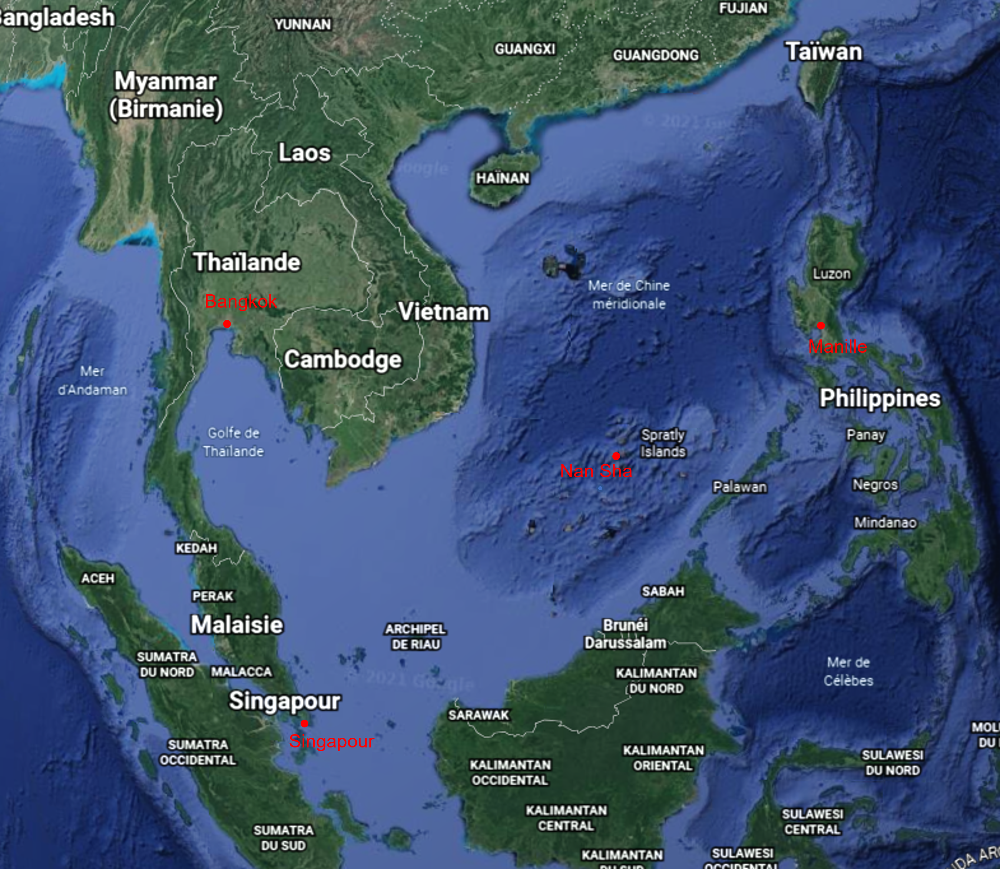


<div class="alert alert-block alert-info">
    Certaines parties de ce code ont été réalisées en discussion avec d'autres membres de ma promotion, principalement Danaé Texier
</div>


# Sommaire
* [Introduction](#intro)
    * [Obtention des données](#chap1_2)
        * [Données altimétriques](#chap1_2_1)
        * [Choix des marégraphes](#chap1_2_2)
* [Bibliothèques & Fonctions](#chap1)
* [Compilation et section des données altimétriques](#chap2)
* [Création de la trend map](#chap3)
* [Tendance mensuelle des données altimétrique](#chap4)
* [Comparaison avec les données marégraphiques et globales](#chap5)
* [Coefficients de corrélation](#chap6)
* [Discussions et conclusion](#conclu)
* [Mise en page](#last)

# Bibliothèques & Fonctions <a class='anchor' id='chap1'></a>

In [1]:
import xarray as xarray
import pandas as pd
import matplotlib.pyplot as plt
import glob as glob
import numpy as np
from datetime import datetime, timedelta

In [2]:
def psmsl_reader(filename,name):
    """Fonction permettant d'ouvrir les fichiers téléchargés depuis le site PSMSL en DataFrame avec un index en datetime"""
    df=pd.read_csv(filename,delimiter=';',comment='#',usecols=[0,1],
                   names=['date',name],na_values=-99999,parse_dates=True)

    #df.set_index('date',inplace=True)
    
    return df

def LSQ_solver(data,T):
    """Fonction permettant de calculer la solution par ajustement par moindres carrées d'un vecteur de données y et de sa matrice A.
    Donne yfit la tendance résultat, x les paramètres de la tendance, Qx la matrice de covariance (incertitudes) et e les 
    résidus(différences entre valeurs observées et la tendance)"""
    
    # Matrix A
    #data = [x for x in data if np.isnan(x) == False]
    t=np.array(T)#.where([x for x in data if np.isnan(x) == False]))
    y=np.array(data)
    
    A=np.zeros((y.shape[0],2))
    A[:,0]=1
    A[:,1]=t
    
    # Normal equation system:
    N = np.dot(A.T,A)
    l = np.dot(A.T,y)
    
    # Solve the system:
    Qx = np.linalg.inv(N)
    x = np.dot(Qx,l)
    
    # Get additional results:
    y_fit = np.dot(A,x)
    e = y - y_fit
    
    # rescales the parameter covariance matrix using the factor of variance
    s02 = np.dot(e.T,e)/(A.shape[0]-A.shape[1])
    Qx *= s02
    
    return y_fit,x,Qx,e

def convert_time(datefloat,day=15):
    '''Fonction permettant de convertir une date au format float year en datetime yy-mm-dd hh:nn:ss'''
    result=[]
    for i in range(len(datefloat)):
        start = datefloat.date.iloc[i]
        year = int(start)
        rem = start - year

        base = datetime(year, 1, 1)
        r = base + timedelta(seconds=(base.replace(year=base.year + 1) - base).total_seconds() * rem)
        
        result.append(datetime(r.year,r.month, day))
    
    return result

# Compilation et section des données altimétriques <a class='anchor' id='chap2'></a>

In [3]:
# on ouvre les données altimétriques de la mer de Chine du sud
subset = xarray.open_dataset(r'./chinasea.nc')

# création d'un vecteur de temps en float 
time=pd.to_datetime(subset.time.data)
yn=time.year+(time.month/12)

#création d'une table avec les valeurs sla
sla_tabl=subset.sla.values

<div class="alert alert-block alert-info">
    Suite à une limitation de puissance d'ordinateur, les données ici ouvertes sont celles déjà compilées et sectionnées. Le code utilisé est disponible dans le dossier annexe du package rendu.
</div>

Pour compiler les données datasets, on utilise xarray, qui, à l'instar de pandas, permet de créer des ensembles de données manipulables facilement à partir d'attributs. La donnée cherchée dans l'ensemble de ces datasets est la donnée sla (Sea Level Anomalie) qui est la différence entre le niveau observé et le niveau moyen.

On "empile" ainsi toutes les cartes mensuelles mondiales sla les unes au dessus des autres dans l'ordre chronologique pour créer une série temporelle. On découpe ensuite notre mer de Chine avec la ligne suivante : 

`subset = ds.sel({'lat':slice(-5,24),'lon':slice(98,123)})`

Entre les latitudes -5° et 24° (par rapport à l'Equateur) et longitudes 98 et 123° (par rapport à Greenwich).
Ces données étant moins volumineuses, on peut les enregistrer sous format .nc et les exporter pour gagner du temps de calcul.

# Calcul de la trend map <a class='anchor' id='chap3'></a>

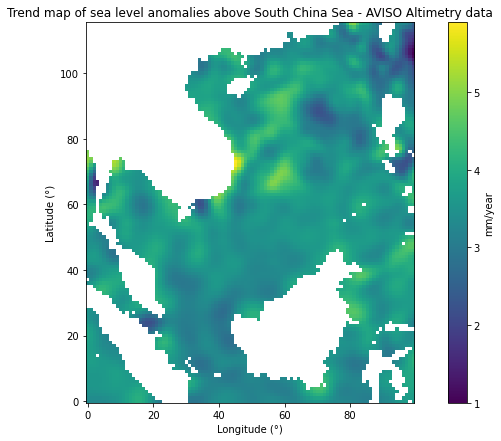

In [4]:
# création d'un tableau vide de la même grandeur lon/lat que notre carte
trendmap=np.zeros((len(subset.lat.data),len(subset.lon.data)))

# double boucle sur les lon et les lat pour calculer à chaque fois l'ajustement par moindres carrés de chaque pixel
for i in np.arange(0,len(subset.lat.data),1):
    for j in np.arange(0,len(subset.lon.data),1):
        if sla_tabl[:,i,j].all!=np.nan:
            y,x,q,e=LSQ_solver(sla_tabl[:,i,j]*1000,yn)
            trendmap[i,j]=x[1]

#affichage et enregistrement de la carte
plt.figure(figsize=[12,7])
plt.imshow(trendmap)
plt.gca().invert_yaxis()
clb=plt.colorbar()
clb.set_label('mm/year')
plt.title("Trend map of sea level anomalies above South China Sea - AVISO Altimetry data")
plt.xlabel("Longitude (°)")
plt.ylabel("Latitude (°)")

plt.savefig("REGIEN_SouthChina_Sea_map.png")

L'avantage principal de ces datasets xarray est que le nombre d'informations sur les données enregistrées est impressionant. De nombreuses outils, fonctions et de modes de représentations sont disponibles.

Ici, en réalisant une boucle double sur les latitudes et sur les longitudes, nous pouvons construire une carte de tendance de l'évolution de la valeur de la sla pour chaque pixel.
Pour cela, on ajuste par moindre carré la série temporelle de chaque pixel et on inscrit dans une grille vierge la valeur de la vitesse issue de l'ajustement. D'après Cazenave et al. (2018), le principal paramètre impactant la sla ici est l'expansion thermique océanique.

La carte montre une tendance positive sur l'ensemble de la zone, comprise entre 1 et presque 6 mm/an.

# Tendance mensuelle des données altimétriques <a class='anchor' id='chap4'></a>

Variance expliquée : -113.46%


'\nfile = open("REGIEN_China_Sea.txt","w")\nfile.write("# monthly timeseries of the regional spatial mean sea level evolution over the altimetry period in China Sea - AVISO dataset \n# yyyy-mm-dd hh:nn:ss ; sea level anomaly (mm)\n")\nfor k in range(len(time)):\n    file.write(f"{time[k]};{trend_alti[k]}\n")\nfile.close\n'

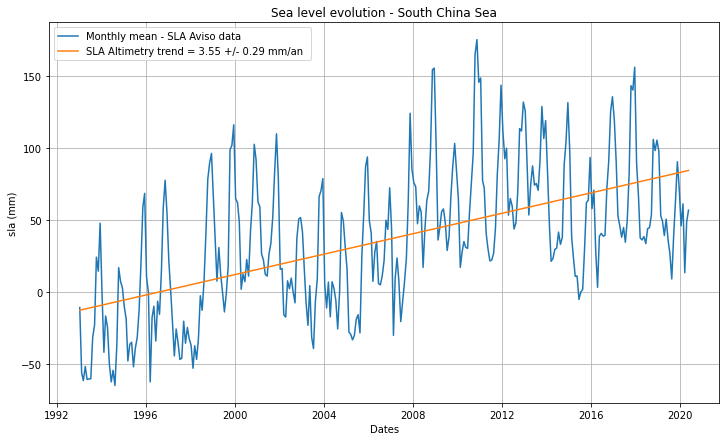

In [5]:
# on construit un vecteur avec la moyenne de tous les pixels de la carte par an (moyenne sans nan)
trend_alti=np.zeros(329)
for i in range(329):
    trend_alti[i]=np.nanmean(subset.sla.data[i])*1000

# on construit une dataframe avec les résultats
df_Mtrend=pd.DataFrame(data=trend_alti,index=time,columns=['Alti'])

# on ajuste par moindres carrés pour trouver la vitesse du sla en mm/an
alt_fit,xalt,Qxalt,ealt=LSQ_solver(trend_alti,yn)
# on calcule la variance expliquée
print(f'Variance expliquée : {round(((np.var(alt_fit)-np.var(ealt))/np.var(alt_fit))*100,2)}%')

# plot
plt.figure(figsize=[12,7])
plt.plot(time,trend_alti,label="Monthly mean - SLA Aviso data")
plt.plot(time,alt_fit,label=f"SLA Altimetry trend = {round(xalt[1],2)} +/- {round(np.sqrt(Qxalt[1,1]),2)} mm/an ")
plt.title("Sea level evolution - South China Sea")
plt.ylabel('sla (mm)')
plt.xlabel('Dates')
plt.grid()
plt.legend()

# on enregistre ces données dans un fichier .txt
'''
file = open("REGIEN_SouthChina_Sea.txt","w")
file.write("# monthly timeseries of the regional spatial mean sea level evolution over the altimetry period in China Sea - AVISO dataset \n# yyyy-mm-dd hh:nn:ss ; sea level anomaly (mm)\n")
for k in range(len(time)):
    file.write(f"{time[k]};{trend_alti[k]}\n")
file.close
'''

Ici, le but est de compiler la valeur moyenne de la sla sur la zone. Pour cela, au lieu de faire une boucle par pixel, on applique directement une nanmean sur l'ensemble du dataset, possible grâce à xarray. Chaque carte mensuelle devient donc une valeur unique permettant de construire ce profil de tendances moyennes mensuelles.

Par ajustement par moindres carrés, on peut calculer la vitesse et l'incertitude de celle-ci. On observe donc une évolution en mer de Chine méridionale de 3.55 +/- 0.29 mm/an. 
Cependant, en calculant la variance expliquée, on voit que cette tendance linéaire ne représente pas parfaitement la série avec une valeur de -113%. Cette grande différence peut s'expliquer par la variabilité et la cyclicité de la sla, complètement gommées sur une régression linéaire simple.

# Comparaison avec les données marégraphiques et globales <a class='anchor' id='chap5'></a>

In [6]:
# Ouverture des 4 jeux de données marégraphiques et suppression des nan
df_BA=psmsl_reader(r'./tidegauge_data/Bangkok_444.txt','BA')
df_BA=df_BA.dropna()
df_BA.drop(df_BA.loc[df_BA.date<1993].index, inplace=True)

df_CH=psmsl_reader(r'./tidegauge_data/ile_Chine1730.txt','CH')
df_CH=df_CH.dropna()

df_MA=psmsl_reader(r'./tidegauge_data/Manilla_145.txt','MA')
df_MA=df_MA.dropna()
df_MA.drop(df_MA.loc[df_MA.date<1993].index, inplace=True)

df_SI=psmsl_reader(r'./tidegauge_data/Singapore_1248.txt','SI')
df_SI=df_SI.dropna()
df_SI.drop(df_SI.loc[df_SI.date<1993].index, inplace=True)

Ici on ouvre les différentes séries temporelles des marégraphes. On commence par supprimer les éventuelles valeurs nan. Pour les séries plus anciennes que 1993, on supprime également ces valeurs pour ne garder que les valeurs entre 1993 et 2021, pour avoir les bonnes tendances sur les mêmes périodes.

In [7]:
# Ajustement par moindres carrés pour obtenir les vitesses d'évolution du niveau marin
BA=df_BA.BA
BA_fit,xBA,QxBA,eBA=LSQ_solver(BA,df_BA.date)

MA=df_MA.MA
MA_fit,xMA,QxMA,eMA=LSQ_solver(MA,df_MA.date)

SI=df_SI.SI
SI_fit,xSI,QxSI,eSI=LSQ_solver(SI,df_SI.date)

CH_fit,xCH,QxCH,eCH=LSQ_solver(df_CH.CH,df_CH.date)

On ajuste par moindres carrés les séries pour en déduire tendance, incertitudes et résidus.

In [8]:
# On convertit les index des dataframes en datetime
df_BA['datetime'] = convert_time(df_BA)
df_BA.set_index('datetime',inplace=True)
del(df_BA['date'])

df_MA['datetime'] = convert_time(df_MA)
df_MA.set_index('datetime',inplace=True)
del(df_MA['date'])

df_SI['datetime'] = convert_time(df_SI)
df_SI.set_index('datetime',inplace=True)
del(df_SI['date'])

df_CH['datetime'] = convert_time(df_CH)
df_CH.set_index('datetime',inplace=True)
del(df_CH['date'])

In [9]:
# ouverture des données globales
glob_trend=pd.read_csv(r'./global_trend.csv',delimiter=',',names=['time','Global'],parse_dates={'datetime':[0]})
glob_trend=glob_trend.dropna()
glob_trend=glob_trend[:-1]
glob_fit,xglob,Qxglob,eglob =LSQ_solver(glob_trend.Global,yn)
glob_trend.set_index(df_Mtrend.index,inplace=True)

Les données globales sont des données similaires aux données altimétriques sauf que celles-ci sont déjà compilées pour la globalité du globe. Elles sont issues du CMEMS, téléchargées par protocole ftp directement. Ces données sont journalières, de 1993 à 2020.

On applique le même protocole d'ajustement que l'ensemble des autres séries.

<div class="alert alert-block alert-info">
    Suite à une limitation de puissance d'ordinateur, les données ici ouvertes sont des données moyennées au mois. Le code utilisé est disponible dans le dossier annexe du package rendu.
</div>

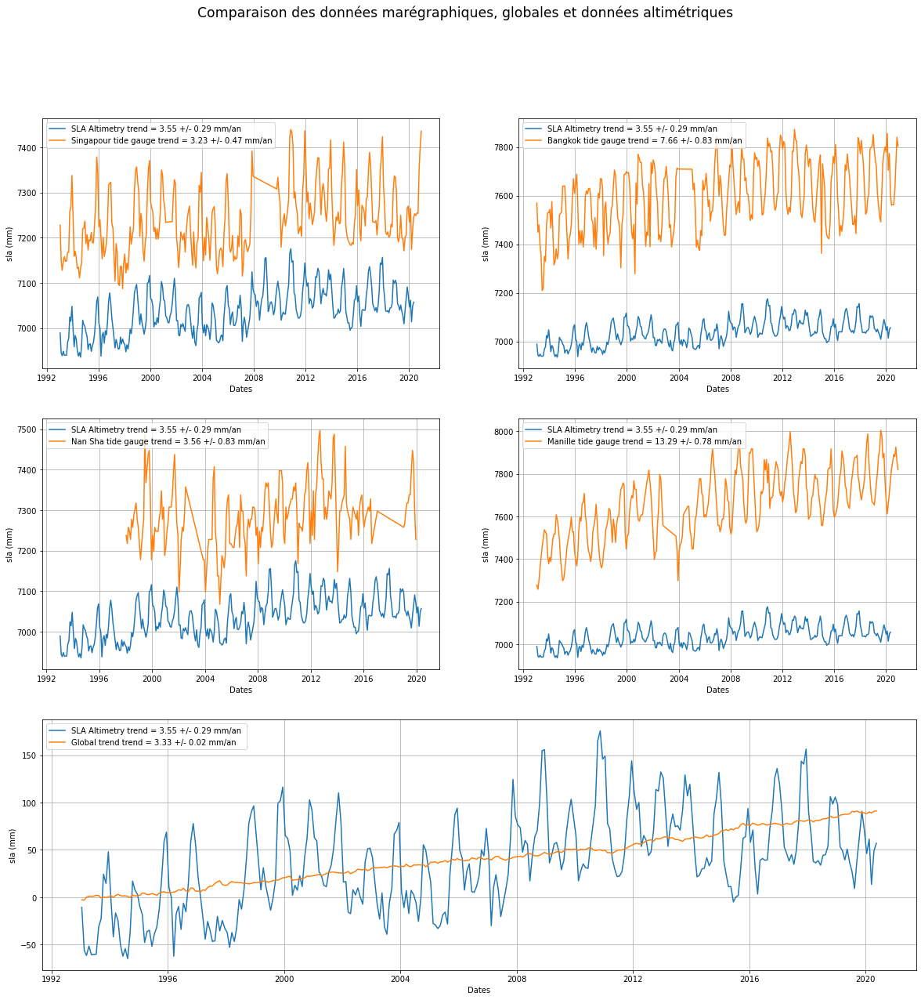

In [10]:
# plot de comparaison
plt.figure(figsize=[20,20])
plt.suptitle('Comparaison des données marégraphiques, globales et données altimétriques',size='xx-large')
plt.subplot(321)
plt.plot(subset.time,trend_alti+7000,label=f"SLA Altimetry trend = {round(xalt[1],2)} +/- {round(np.sqrt(Qxalt[1,1]),2)} mm/an ")
plt.plot(df_SI.index,SI+200,label=f'Singapour tide gauge trend = {round(xSI[1],2)} +/- {round(np.sqrt(QxSI[1,1]),2)} mm/an')
plt.grid()
plt.ylabel('sla (mm)')
plt.xlabel('Dates')
plt.legend()
plt.subplot(322)
plt.plot(subset.time,trend_alti+7000,label=f"SLA Altimetry trend = {round(xalt[1],2)} +/- {round(np.sqrt(Qxalt[1,1]),2)} mm/an ")
plt.plot(df_BA.index,BA+200,label=f'Bangkok tide gauge trend = {round(xBA[1],2)} +/- {round(np.sqrt(QxBA[1,1]),2)} mm/an')
plt.grid()
plt.ylabel('sla (mm)')
plt.xlabel('Dates')
plt.legend()
plt.subplot(323)
plt.plot(subset.time,trend_alti+7000,label=f"SLA Altimetry trend = {round(xalt[1],2)} +/- {round(np.sqrt(Qxalt[1,1]),2)} mm/an ")
plt.plot(df_CH.index,df_CH.CH+300,label=f'Nan Sha tide gauge trend = {round(xCH[1],2)} +/- {round(np.sqrt(QxCH[1,1]),2)} mm/an')
plt.grid()
plt.ylabel('sla (mm)')
plt.xlabel('Dates')
plt.legend()
plt.subplot(324)
plt.plot(subset.time,trend_alti+7000,label=f"SLA Altimetry trend = {round(xalt[1],2)} +/- {round(np.sqrt(Qxalt[1,1]),2)} mm/an ")
plt.plot(df_MA.index,MA+200,label=f'Manille tide gauge trend = {round(xMA[1],2)} +/- {round(np.sqrt(QxMA[1,1]),2)} mm/an')
plt.grid()
plt.ylabel('sla (mm)')
plt.xlabel('Dates')
plt.legend()
plt.subplot(313)
plt.plot(subset.time,trend_alti,label=f"SLA Altimetry trend = {round(xalt[1],2)} +/- {round(np.sqrt(Qxalt[1,1]),2)} mm/an ")
plt.plot(glob_trend.index,glob_trend.Global,label=f'Global trend trend = {round(xglob[1],2)} +/- {round(np.sqrt(Qxglob[1,1]),2)} mm/an')
plt.grid()
plt.ylabel('sla (mm)')
plt.xlabel('Dates')
plt.legend()

#plt.savefig("REGIEN_SouthChina_Sea_curve.png")

Cette figure permet de visualiser l'ensemble des séries et de pouvoir faire une comparaison visuelle d'une part, mais également de pouvoir apprécier les différences de tendance.

Le point le plus important avant de commencer l'analyse est de préciser la notion de relatif, d'absolu et de parler des références.
Ici, nous comparons des données altimétriques, à des données marégaphiques. Il est donc impossible d'avoir une référence commune pour l'ensemble de ces données. Comme bien souvent dans ces cas-là, l'important n'est pas de regarder la valeur mais de regarder la variabilité des paramètres que l'on prend en compte, et leur comportement les unes par rapport aux autres.
On peut donc ajouter un offset aux données pour mieux les visualiser. La valeur en elle-même n'a donc pas de valeur de comparaison ici.

**Détails des comparaisons**

Les tendances du marégraphe de Singapour et des données altimétriques montre une tendance proche, qui se recoupe dans les incertitudes.

A Nan Sha, les tendances sont très proches : ce marégraphe se situe sur une île au centre de la mer de Chine, ce qui est permet une meilleure corrélation avec l'altimétrie, point que nous développerons dans la discussion.

A Bangkok, on observe une différence assez marquée des tendances à hauteur de 4 mm/an. La différence à Manille monte à plus de 10 mm/an. Ces régions du monde sont connus pour des tendances d'élévation du niveau de la mer très élevées liés aux mouvements verticaux dans cette région du monde.

Les tendances entre la tendance mondiale et la tendance locale se recoupent dans les incertitudes. On peut donc observer que les sla évoluent dans une tendance similaire à la tendance globale depuis 3 décennies.


**Remarque**
L'incertitude sur la série temporelle globale est sous-estimée, à cause des nombreuses opérations de moyennages.

# Coefficients de corrélation <a class='anchor' id='chap6'></a>

In [11]:
# on crée les dataframes des résidus des ajustements par moindres carrés
df_ealti=pd.DataFrame(data=ealt,index=df_Mtrend.index,columns=['Altimétrie'])
df_eBA=pd.DataFrame(data=eBA,index=df_BA.index,columns=['Bangkok'])
df_eSI=pd.DataFrame(data=eSI,index=df_SI.index,columns=['Singapour'])
df_eMA=pd.DataFrame(data=eMA,index=df_MA.index,columns=['Manille'])
df_eCH=pd.DataFrame(data=eCH,index=df_CH.index,columns=['Nan Sha'])
df_eglob=pd.DataFrame(data=eglob,index=glob_trend.index,columns=['Global'])

# on concatenate les différentes dataframes pour créer la dataframe de corrélation
df_correl=pd.concat([df_ealti,df_eBA,df_eSI,df_eCH,df_eMA,df_eglob],axis=1)
df_correl

,Altimétrie,Bangkok,Singapour,Nan Sha,Manille,Global
1993-01-15,1.865388,78.809963,34.785070,NaN,-193.597698,1.568723
1993-02-15,-43.824682,-41.827897,-45.484385,NaN,-214.704685,1.018626
1993-03-15,-49.529369,-12.465757,-65.753840,NaN,-175.811673,3.724372
1993-04-15,-39.982128,-93.104383,-46.023619,NaN,-116.919990,4.461720
1993-05-15,-49.274802,-143.742243,-36.293074,NaN,-68.026978,4.177207
...,...,...,...,...,...,...
2020-08-15,NaN,-139.405904,-27.440168,NaN,53.843106,NaN
2020-09-15,NaN,-83.043764,-28.709623,NaN,42.736118,NaN
2020-10-15,NaN,26.317611,69.020598,NaN,85.627801,NaN
2020-11-15,NaN,136.679751,119.751143,NaN,17.520813,NaN


In [12]:
# on calcule le coefficient de corrélation selon la méthode de pearson
df_correl.corr(method='pearson')

,Altimétrie,Bangkok,Singapour,Nan Sha,Manille,Global
Altimétrie,1.000000,0.576729,0.929914,0.130613,0.102443,-0.250699
Bangkok,0.576729,1.000000,0.521373,-0.193153,-0.436510,-0.181207
Singapour,0.929914,0.521373,1.000000,0.053568,-0.037461,-0.231303
Nan Sha,0.130613,-0.193153,0.053568,1.000000,0.633351,-0.059495
Manille,0.102443,-0.436510,-0.037461,0.633351,1.000000,-0.147420
Global,-0.250699,-0.181207,-0.231303,-0.059495,-0.147420,1.000000


Contrairement aux comparaisons des tendances, les résultats du calcul du coefficient de corrélation ne montrent pas de corrélation pure entre les oscillations des sla. 

Les coefficients de corrélation sont calculés sur les résidus de l'ajustement des moindres carrés, où les données dont la tendance a été enlevée pour ne garder l'impact que des différentes oscillations.
Or, les impacts de la côte induisent un signal supplémentaire à la valeur de la sla que l'altimétrie ne peut pas prendre en compte, créant des oscillations qui font différer les résidus après ajustement par moindres carrés.

# Discussions et conclusion <a class='anchor' id='conclu'></a>

La première chose que nous avons vu est que les tendances sont souvent proches entre les différentes séries temporelles (sauf situation géologique qui diffère : Manille, Bangkok) alors que les coefficients de corrélation sont plutôt mauvais.

La précision à la côte de l'altimétrie est limitée, en raison du survol par le satellite de la zone littorale qui n'a pas forcément d'eau. Ces imprécisions peuvent impacter les mesures. Ici, avec un tel taux de moyennage (l'ensembles des traces au mois), ces erreurs restent minimes. D'après Cazenave et al. (2018), l'altimétrie n'est efficace qu'au délà de 20km des côtes.
Concernant les différences sur les corrélations ici également l'impact de la côte peut influer et créer de si grandes différences : moins de profondeurs d'eau, la façon dont le marégraphe est installé et enregistre (dans un port, dans un delta, un puits tranquilisant), mais également des phénomènes à plusieurs niveaux spatiaux et temporels (Cazenave et al. 2018)

Concernant la comparaison avec la tendance mondiale, on peut voir que la situation en mer de Chine méridionale est similaire à la situation globale sur la planète.


En conclusion, on peut voir que l'altimétrie et les données marégraphiques présentent des correspondances en terme de tendances, puisque ces deux méthodes observent tous les deux les variations du niveau marin.
Les marégraphes observent mieux les variations à la côtes, les surcôtes et sont plus efficaces dans des études locales. L'altimétrie permet une couverture des océans au large, là où encore aujourd'hui les méthodes terrestres n'atteignent pas une couverture globale. Ces données permettent d'étudier des régions plus grandes, mais surtout la globalité d'un océan, ce qui n'est pas possible avec les marégraphes, surtout dans certaines régions du monde. 

Référence : Cazenave, A., Palanisamy, H., & Ablain, M. (2018). Contemporary sea level changes from satellite altimetry: What have we learned? What are the new challenges?. Advances in Space Research, 62(7), 1639-1653. [https://doi.org/10.1016/j.asr.2018.07.017] 

# Mise en page <a class='anchor' id='last'></a>

In [13]:
# Lignes pour centrer les graphiques matplotlib
from IPython.core.display import HTML
HTML("""
<style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style>
""")

In [14]:
%%html
<style>
body {font-family: Trebuchet MS}
p {font-family: Trebuchet MS, font-size:16px}
h1 {color:white;background-color:LightSeaGreen;border 4px LightSeaGreen;font-size: 20px}
h2 {color:LightSeaGreen;font-size: 12px}
.info {color:white;background-color:SteelBlue;border 4px SteelBlue;font-size: 20px}
.code {color:white;background-color:Grey     ;border:4px solid Grey     ;font-size: 10px}
.reponse {color:white;background-color:red      ;border:4px solid Red;font-size: 20px}
.note {color:purple;background-color:pink;border:4px solid pink;border-radius:25px}
</style>